Successfully loaded config file: C:\Users\sens\Desktop\FingernailProjection\FingernailProjection\config.json
Changed attributes: floodfill_use_hsv, floodfill_smoothing_radius, floodfill_threshold, skincolor_open_radius, skincolor_close_radius, linestring_smoothing, image_rotation, exposure_time, small_image_scale_factor, milliseconds_until_timeout, frame_rate, recording_window_scale_mode, debug_screen_index, projection_screen_index, hand_contour_detection_mode, hand_contour_threshold_mode, dilate_and_erode_kernel_radius, adaptive_threshold_kernel_radius, adaptive_threshold_offset, manual_threshold_value, canny_blurr_size, low_threshold, high_threshold, binarization_threshold, opening_kernel_size, closing_kernel_size, subtraction_mode, history_count, sensitivity_knn, contour_selection_mode, minimum_contour_length, curve_averaging, stabilization_enabled, blurr_size, fingertip_detection_mode, offset_away_from_centroid, use_centroid_not_botleft, mediapipe_basepoint_index, max_distance_from

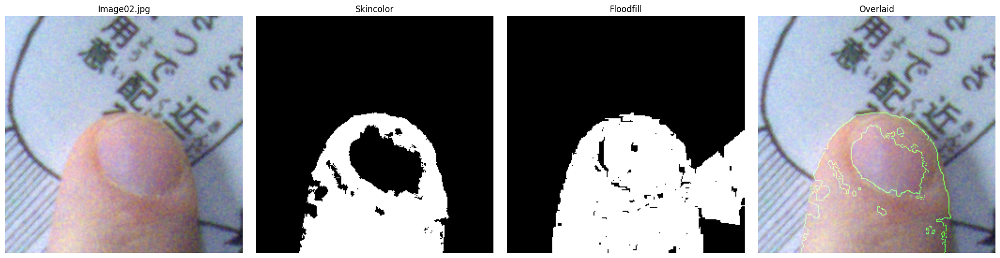

Hand index: 0, Score: 1.0
orientation_rad :  -2.2722798632531536


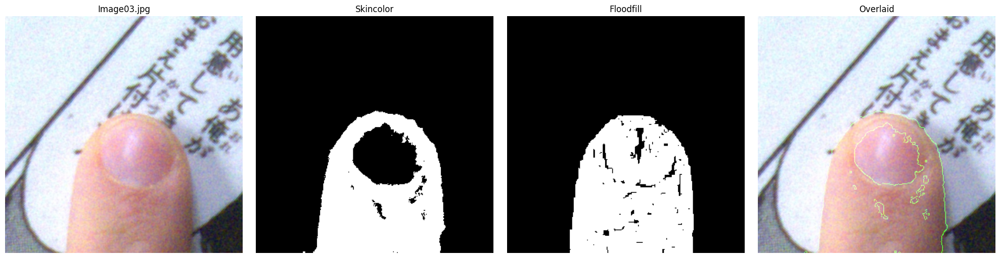

Hand index: 0, Score: 1.0
orientation_rad :  -2.150122358493663


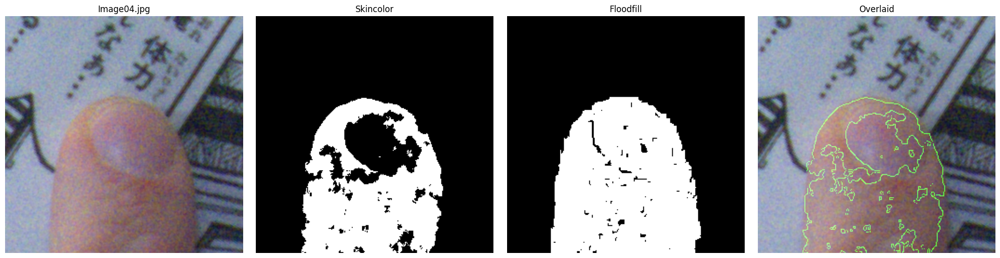

Hand index: 0, Score: 1.0
orientation_rad :  -2.0513914656021077


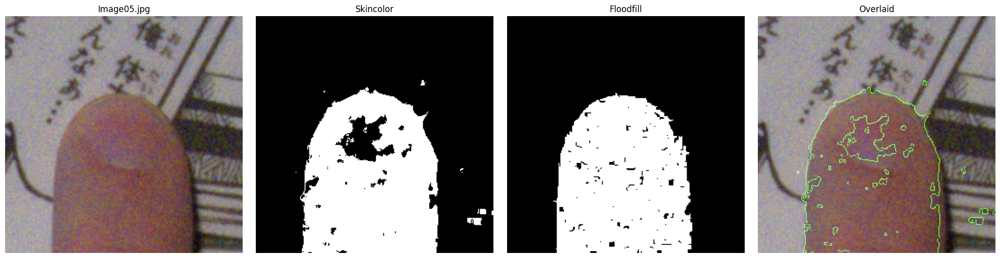

Hand index: 0, Score: 0.7
orientation_rad :  -2.6061731116531672


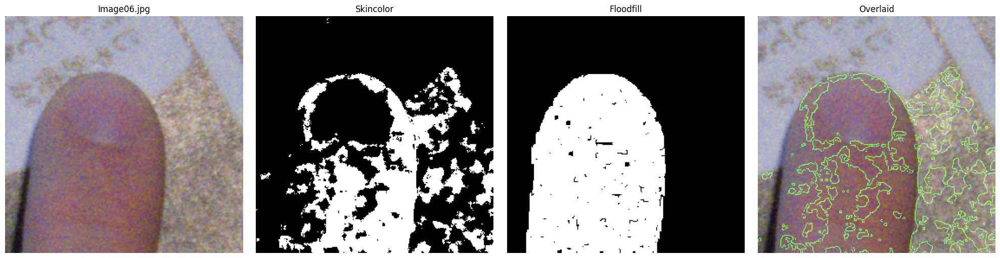

Hand index: 0, Score: 1.0
orientation_rad :  -1.9939676124855739


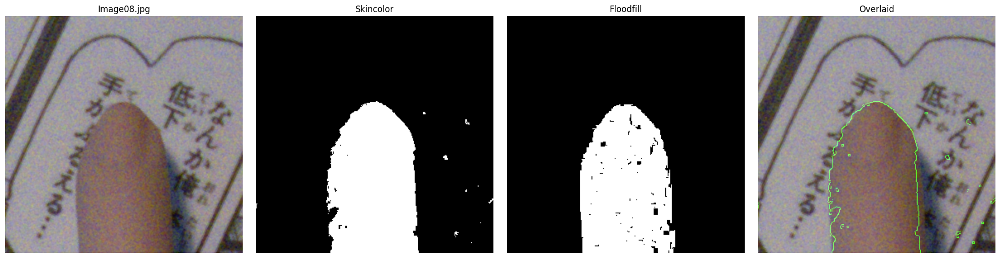

Hand index: 0, Score: 1.0
Multiple hands detected. Confidences: 99.0 % vs. 97.3 %
orientation_rad :  -2.1149149470611635


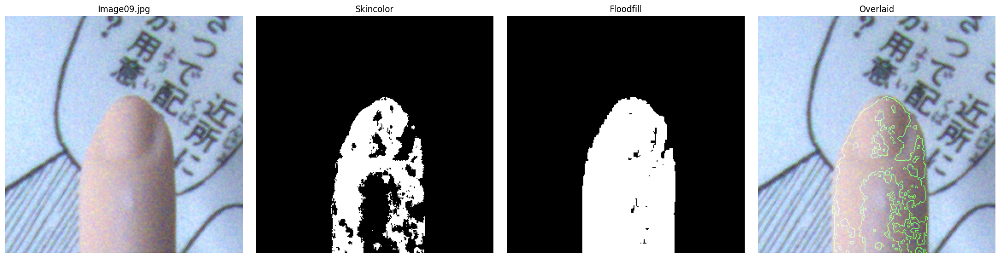

Hand index: 0, Score: 1.0
orientation_rad :  -2.381189283811265


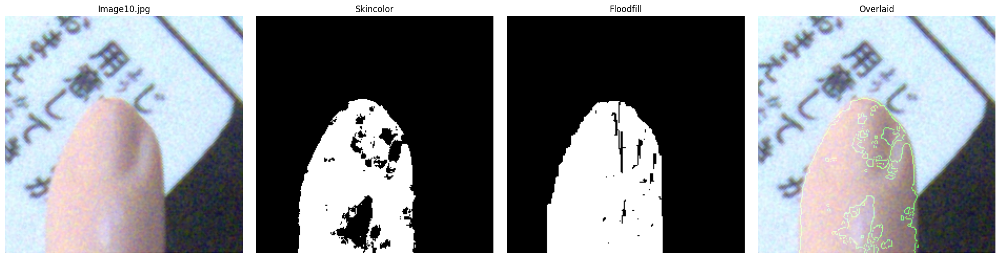

Hand index: 0, Score: 1.0
orientation_rad :  -2.2721821783848504


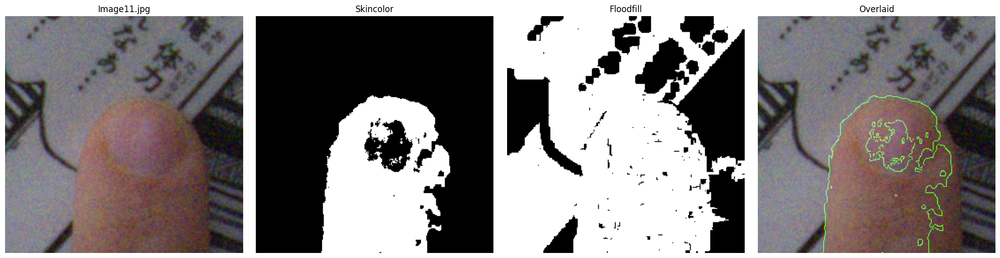

Hand index: 0, Score: 0.9
orientation_rad :  -2.2486968161666905


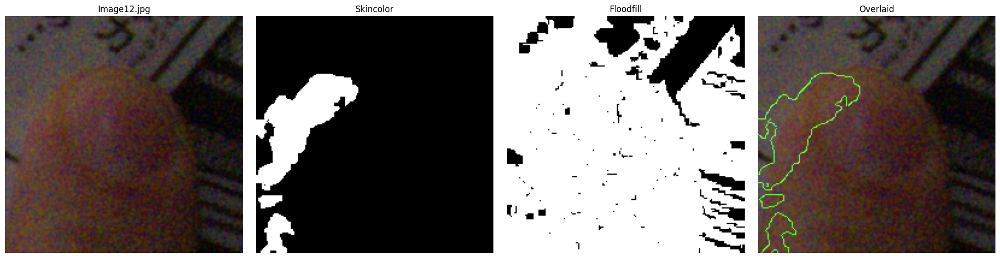

Hand index: 0, Score: 0.9
orientation_rad :  -1.71164844969996


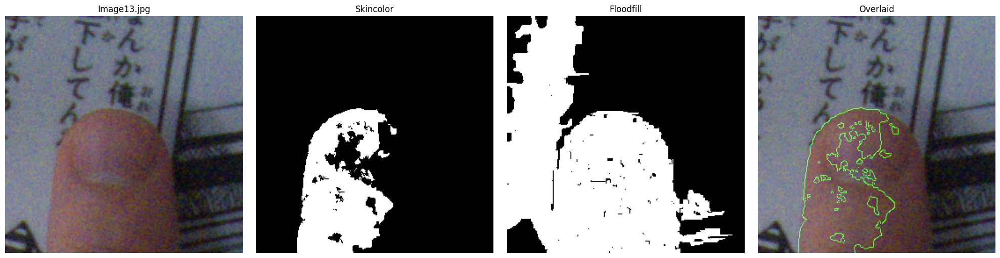

Hand index: 0, Score: 1.0
Multiple hands detected. Confidences: 97.8 % vs. 92.9 %
orientation_rad :  -1.5778384639032088


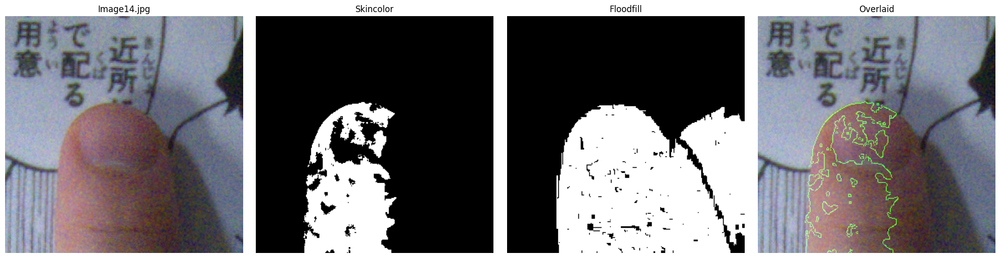

Hand index: 0, Score: 0.9
orientation_rad :  -1.625858722168567


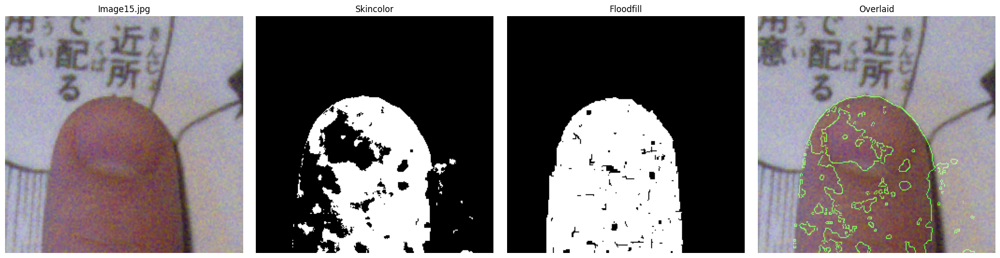

Hand index: 0, Score: 0.9
orientation_rad :  -1.339179897292029


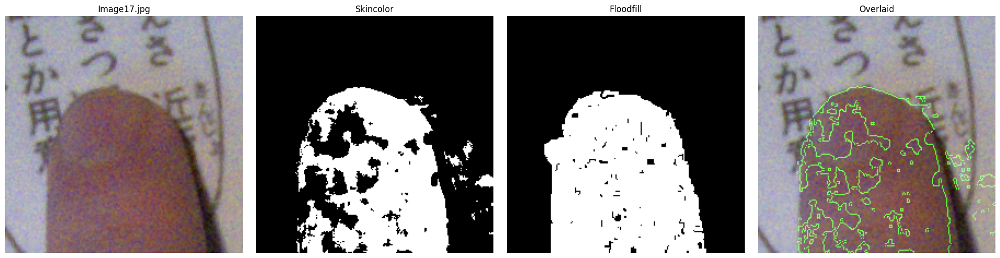

Hand index: 0, Score: 1.0
Multiple hands detected. Confidences: 99.6 % vs. 98.1 %
orientation_rad :  -1.3638041325750756


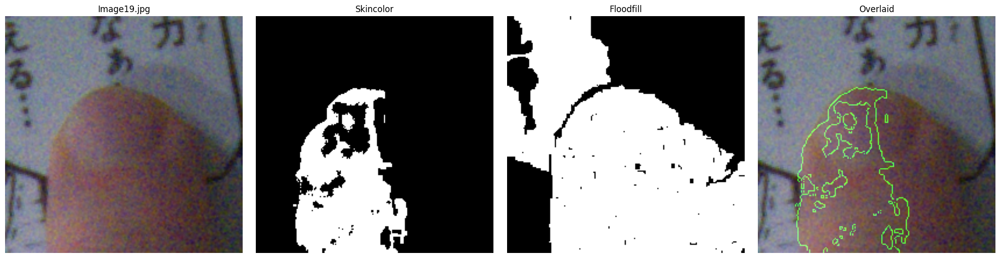

Could not find landmarks in image at path C:\Users\sens\Desktop\FingernailProjection\FingernailProjection\prototyping\hand_dataset\Image22.jpg
Hand index: 0, Score: 1.0
orientation_rad :  -1.1037930256919406


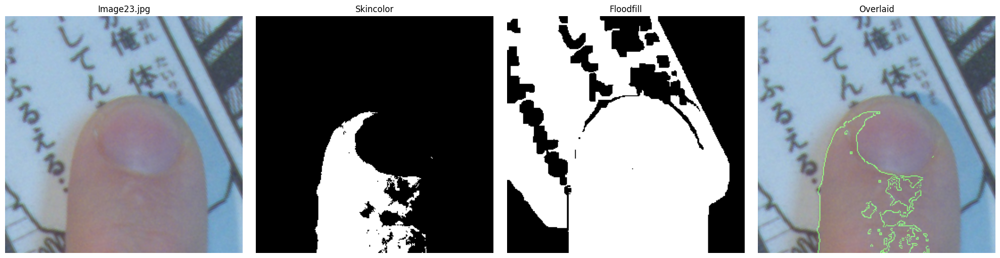

In [1]:
import math
import sys
import os

from numpy import rad2deg

sys.path.append(os.path.abspath(".."))
from rotated_rect_crop import crop_rotated_rectangle
from fingertip_data import skincolor_threshold_image
from skin_detect_config import SkinDetectConfig
from automatic_config_reloader import AutomaticConfigReloader
from config import Config
from prototyping.plotting import *
from drawing import *
import matlike_utils
from tuple_helper import *
import helper

config, _ = AutomaticConfigReloader.get_config_and_reloader(
    r"C:\Users\sens\Desktop\FingernailProjection\FingernailProjection\config.json", Config
)

extractor = FingertipExtractorMediapipe(config)
paths = get_files_in_folder(
    r"C:\Users\sens\Desktop\FingernailProjection\FingernailProjection\prototyping\hand_dataset"
)


def plot_image_skincolor(path):

    image = cv2.imread(path)
    basename = os.path.basename(path)

    if image is None:
        print(f"Could not read image at path {path}")
        return

    landmarks = extractor.find_hand_landmarks(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    if landmarks is None:
        print(f"Could not find landmarks in image at path {path}")
        return

    if landmarks.index is None:
        print(f"Could not find index finger in image at path {path}")
        return

    # Get cutout parameters and perform cutout
    tip_to_joint = subtract(landmarks.index.tip, landmarks.index.frontjoint)
    orientation_rad = get_orientation_rad(tip_to_joint)
    size = 2 * length(tip_to_joint)
    try:
        cutout_image = crop_rotated_rectangle(
            image, (landmarks.index.tip, (size, size), 90 + math.degrees(orientation_rad))
        )
    except:
        print("Cut not cutout image from", path)
        return
    # cutout_image = crop_rotated_rectangle(
    #     image, (landmarks.index.tip, (size, size), 90 + rad2deg(orientation_rad))
    # )
    print("orientation_rad : ", orientation_rad)

    if cutout_image is None or cutout_image.size == 0:
        print("Cutout image is empty", path)
        return

    newpath = helper.append_folder_to_path(path, "cutout_rotated")
    matlike_utils.save(cutout_image, newpath)
    # return

    # Get colors on the finger
    # colors = matlike_utils.pick_colors_along_line(
    #     cv2.GaussianBlur(image, (5, 5), 0), landmarks.index.tip, landmarks.index.frontjoint
    # )
    # config = SkinDetectConfig.create_from_min_and_max_of_colors(colors)
    config = SkinDetectConfig()

    # # Create image with drawings
    # drawed_image = image.copy()
    # for mark in landmarks.all:
    #     draw_point(drawed_image, mark, color=(255, 0, 0), radius=10)
    # draw_rect_with_anchor(drawed_image, landmarks.index.tip, (distance, distance), Anchor.CENTER, color=(0, 0, 255))

    # FLOOD FILL APPROACH
    flooded_mask = matlike_utils.floodfill(
        cv2.blur(cutout_image, (5, 5)), (int(0.5 * size), int(0.5 * size)), 3
    )

    # SKIN TONE APPROACH
    skincolor_mask = skincolor_threshold_image(cutout_image, config)

    # Overlay image with mask
    # colored_cutout_image = overlay_image_with_mask(cutout_image, skincolor_mask, color=WHITE)
    colored_cutout_image = matlike_utils.overlay_image_with_mask(
        cutout_image,
        cv2.Canny(skincolor_mask, 100, 200),
        color=GREEN,
    )

    # # SAME SKIN TONE AS ON LANDMARKS
    # similarity = 25
    # finger_color = matlike_utils.pick_median_color_in_circle(image, landmarks.index.tip, 10)
    # finger_mask = create_color_similar_mask(cutout_image, finger_color, (similarity, similarity, similarity))

    # if (contour := matlike_utils.find_longest_contour(closed_mask)) is not None:
    #     linestring = linestring_utils.convert_contour_to_linestring(contour, True)
    #     linestring = linestring_utils.smooth_linestring(linestring, 20)
    #     draw_linestring(drawed_image, linestring, color=(0, 255, 0), thickness=2, offset=cutout_image_topleft)
    #     draw_linestring(cutout_image, linestring, color=(0, 255, 0), thickness=2)

    # Plot the images
    # plot_image(image, title="Recorded Image")
    # plot_bgr_image(drawed_image, "Landmarked Image", 0.5)

    # draw_point(
    #     colored_cutout_image,
    #     subtract(landmarks.index.tip, cutout_image_topleft),
    #     color=(255, 0, 0),
    #     radius=3,
    # )
    # draw_point(
    #     colored_cutout_image,
    #     subtract(landmarks.index.frontjoint, cutout_image_topleft),
    #     color=(255, 0, 0),
    #     radius=3,
    # )

    plot_rgb_images_horizontally(
        [
            (cutout_image, basename),
            (skincolor_mask, "Skincolor"),
            (flooded_mask, "Floodfill"),
            (colored_cutout_image, "Overlaid"),
        ]
    )


for path in paths:
    plot_image_skincolor(path)

# display = ImageDisplay("Skincolor Detection", Anchor.TOP_LEFT, 0, ScaleMode.FILL )